In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics
%matplotlib inline

import neuro_morpho_toolbox as nmt
# ns=nmt.neuron_set('/Users/pengxie/Documents/Research/fullMorph_classification/data/registered_swc/Janelia_test/swc/Whole/')
ns=nmt.neuron_set('/home/penglab/Documents/Janelia_1000')



/home/penglab/anaconda3/lib/python3.7/site-packages/neuro_morpho_toolbox/
Loading CCF Atlas data...
Loading time: 0.81
Loading CCF brain structure data...
Loading time: 0.00
Loading...
100 loaded: 2.4s
Invalid number of soma found: 0
QC failed: AA0114.swc
Invalid number of soma found: 0
QC failed: AA0115.swc
200 loaded: 2.2s
300 loaded: 2.2s
400 loaded: 2.3s
Invalid number of soma found: 0
QC failed: AA0472.swc
500 loaded: 2.5s
Invalid number of soma found: 0
QC failed: AA0576.swc
Invalid number of soma found: 0
QC failed: AA0585.swc
Invalid number of soma found: 0
QC failed: AA0589.swc
600 loaded: 2.3s
Invalid number of soma found: 0
QC failed: AA0639.swc
Invalid number of soma found: 0
QC failed: AA0670.swc
Invalid number of soma found: 0
QC failed: AA0672.swc
700 loaded: 2.1s
Invalid number of soma found: 0
QC failed: AA0754.swc
Invalid number of soma found: 0
QC failed: AA0763.swc
800 loaded: 2.6s
900 loaded: 1.8s
QC failed: AA0952.swc
QC failed: AA0964.swc
QC failed: AA0968.swc
QC

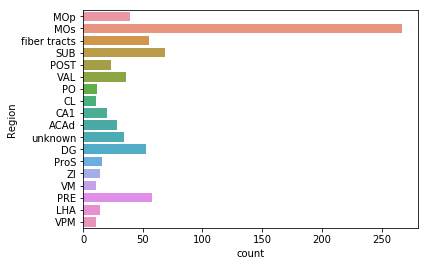

In [3]:
sf = ns.features['soma_features'].region
ct = sf["Region"].value_counts().sort_values(ascending=False)
_ = sns.countplot(y="Region", 
                  data=sf.loc[sf.Region.isin(ct.index[ct>10])],
                 )

In [4]:
_ = ns.ReduceDimUMAP(feature_set="projection_features", n_neighbors=100)


## Initialization for each cluster 

In [6]:
colname = ['Homogeneity','Completeness','V-measure','Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient','parameter']
#method=['SNN_community','Kmeans'
#%% Store all the result
result_COMP = pd.DataFrame(columns = colname)

## For hierarchy

In [ ]:
#%% Store the result of Hierarchy
result_hier = pd.DataFrame(columns = colname)
L_method_list=['single', 'complete','average','weighted','centroid','median','ward']
L_metric_list=['braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine',
               'dice', 'euclidean', 'hamming', 'jaccard', 'kulsinski', 
               'mahalanobis', 'matching','minkowski','rogerstanimoto', 'russellrao',
               'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean']
#linkage using 'yule' and 'jensenshannon' may result in a condensed distance matrix must contain only finite values.

criterionH_list=['inconsistent','distance','maxclust','monocrit','maxclust_monocrit']

hier_dict={'L_method':'single', 'L_metric':'euclidean','criterionH':'inconsistent', 'depth':2,'R':None,'t':0.9,'optimal_ordering':False}
for L_methodidx in L_method_list:
    for L_metricidx in L_metric_list:
        for criterionidx in criterionH_list:
            for depth_iter in range(2,15):
                print(hier_dict)
                _ = ns. get_clusters(method='Hierarchy',karg_dict=hier_dict)
                h = metrics.homogeneity_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                c = metrics.completeness_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                V = metrics.v_measure_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                ARI = metrics.adjusted_rand_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                AMI = metrics.adjusted_mutual_info_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
                if len(typeR)<2:
                    SS = 'below'
                elif len(typeR)>=ns.UMAP.shape[0]:
                    SS = 'above'
                else:
                    SS = metrics.silhouette_score(ns.UMAP, ns.metadata['Cluster'], metric='sqeuclidean')
                tempDF = pd.DataFrame([h, c,V,ARI,AMI,SS,hier_dict]).T.copy()
                tempDF.columns=colname
                result_hier = result_hier.append(tempDF)     
                hier_dict.update(criterionH = criterionidx )                    
            hier_dict.update(depth = depth_iter )                     
        hier_dict.update(L_metric = L_metricidx )
    hier_dict.update(L_method = L_methodidx)
idx_hier = ['Hier'+str(x) for x in range(result_hier.shape[0])]    
result_hier['idx'] = idx_hier
result_hier.set_index('idx',inplace=True)    

{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite value

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.342
{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.520
{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.511
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.511
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.511
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.511
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.511
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.511
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.511
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values,

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condens

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'sing

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'sing

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'm

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'sing

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cor

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infini

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infini

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values,

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinit

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the defa

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed dista

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed d

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering':

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_met

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': Fal

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLusteri

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.530
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.530
{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.821
Completeness: 0.470
V-measure: 0.598
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.122
Silhouette Coefficient: 0.530


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508
{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.810
Completeness: 0.472
V-measure: 0.596
Adjusted Rand Index: 0.024
Adjusted Mutual Information: 0.134
Silhouette Coefficient: 0.508


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.820
Completeness: 0.477
V-measure: 0.603
Adjusted Rand Index: 0.030
Adjusted Mutual Information: 0.142
Silhouette Coefficient: 0.342


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.815
Completeness: 0.472
V-measure: 0.598
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.133
Silhouette Coefficient: 0.520


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.511
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511
{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.808
Completeness: 0.470
V-measure: 0.595
Adjusted Rand Index: 0.023
Adjusted Mutual Information: 0.131
Silhouette Coefficient: 0.511


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values,

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default valu

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infini

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infini

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infini

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_m

{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.162
Completeness: 0.767
V-measure: 0.268
Adjusted Rand Index: 0.149
Adjusted Mutual Information: 0.146
Silhouette Coefficient: 0.564
{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infini

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797
Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632
{'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.797


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Completeness: 0.447
V-measure: 0.573
Adjusted Rand Index: 0.011
Adjusted Mutual Information: 0.076
Silhouette Coefficient: -0.632


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix h

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed dista

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
N

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418
{'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.479
V-measure: 0.603
Adjusted Rand Index: 0.035
Adjusted Mutual Information: 0.151
Silhouette Coefficient: 0.418


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed d

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
************

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527
{'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.472
V-measure: 0.599
Adjusted Rand Index: 0.025
Adjusted Mutual Information: 0.130
Silhouette Coefficient: 0.527


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering':

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_met

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.419
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.419
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419
{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.819
Completeness: 0.479
V-measure: 0.605
Adjusted Rand Index: 0.032
Adjusted Mutual Information: 0.149
Silhouette Coefficient: 0.419


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': Fal

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'single', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'single', 'L_metric': 's

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106
Silhouette Coefficient: 0.537


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.845
Completeness: 0.469
V-measure: 0.603
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.106


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.537
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.538
{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.538


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.362
{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.833
Completeness: 0.465
V-measure: 0.597
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.362


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534
{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.839
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.534


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.466
V-measure: 0.598
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinit

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_orde

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the def

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the def

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the def

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'crite

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the def

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix h

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.541
Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.541


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Completeness: 0.381
V-measure: 0.447
Adjusted Rand Index: 0.037
Adjusted Mutual Information: 0.085
Silhouette Coefficient: -0.868
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.565
{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Numb

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condens

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462
{'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.828
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.462


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the con

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed dis

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.843
Completeness: 0.470
V-measure: 0.603
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.540
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterion

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': F

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.465
{'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.467
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.465


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_orderi

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'complete', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.576
{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.835
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.107
Silhouette Coefficient: 0.576


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.580
{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.580


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.395
{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.466
V-measure: 0.597
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.395


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562
{'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.470
V-measure: 0.601
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.117
Silhouette Coefficient: 0.562


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.110
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.591
Completeness: 0.386
V-measure: 0.467
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.916


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066
Silhouette Coefficient: -0.586


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.813
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.066


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.586
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': Fals

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'average', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:***

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed d

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.00

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.500
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.500
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.500
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.500
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.500
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.500
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.500
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.500
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.500
{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.826
Completeness: 0.468
V-measure: 0.597
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.500


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condens

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.583
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'average', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metr

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.505
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505
{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.825
Completeness: 0.470
V-measure: 0.599
Adjusted Rand Index: 0.021
Adjusted Mutual Information: 0.123
Silhouette Coefficient: 0.505


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering':

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'average', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, t

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600
Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.838
Completeness: 0.467
V-measure: 0.600


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Rand Index: 0.014
Adjusted Mutual Information: 0.105
Silhouette Coefficient: 0.560
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.569
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.569
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.569
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.569
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.569
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.569
{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.831
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.569


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.374
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.374
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.374
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.374
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.374
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.374
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374
{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.113
Silhouette Coefficient: 0.374


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566
{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.836
Completeness: 0.468
V-measure: 0.600
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.566


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565
{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.466
V-measure: 0.596
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.112
Silhouette Coefficient: 0.565


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.581
Completeness: 0.382
V-measure: 0.461
Adjusted Rand Index: 0.013
Adjusted Mutual Information: 0.061
Silhouette Coefficient: -0.892


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.067
Silhouette Coefficient: -0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.814
Completeness: 0.448
V-measure: 0.578
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.067


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: -0.584
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Numb

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condens

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distanc

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.502
{'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.830
Completeness: 0.467
V-measure: 0.598
Adjusted Rand Index: 0.016
Adjusted Mutual Information: 0.111
Silhouette Coefficient: 0.502


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the con

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015
Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.834
Completeness: 0.467
V-measure: 0.599
Adjusted Rand Index: 0.015


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.109
Silhouette Coefficient: 0.577
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterion

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted 

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.497
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.497
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.497
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.497
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.497
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.497
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.497
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.497
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.497
{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115
Silhouette Coefficient: 0.497


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.829
Completeness: 0.468
V-measure: 0.598
Adjusted Rand Index: 0.017
Adjusted Mutual Information: 0.115


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.497
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': N

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mutual Information: 0.000
Number of labels is 1, no available Silhouette Coefficient can be calculated
{'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
For input {'L_method': 'weighted', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.000
Completeness: 1.000
V-measure: 0.000
Adjusted Rand Index: 0.000
Adjusted Mut

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'cosine', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'dice', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'euclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'hamming', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'jaccard', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'kulsinski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'mahalanobis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'matching', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'minkowski', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'rogerstanimoto', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'russellrao', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'seuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalmichener', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119
Silhouette Coefficient: 0.584


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method centroidrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'centroid', 'L_metric': 'sokalsneath', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.827
Completeness: 0.469
V-measure: 0.599
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.119


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.584
{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'sqeuclidean', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'braycurtis', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'canberra', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'cityblock', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'maxclust_monocrit', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116
Silhouette Coefficient: 0.575


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'distance', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018
Adjusted Mutual Information: 0.116


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Silhouette Coefficient: 0.575
{'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}
Result of Hierarchy CLustering
*************Note:**************
Method medianrequires the distance metric to be Euclidean
*************Note:**************
For input {'L_method': 'median', 'L_metric': 'correlation', 'criterionH': 'maxclust', 'depth': 14, 'R': None, 't': 0.9, 'optimal_ordering': False}, the condensed distance matrix has infinite values, just use the default value
Homogeneity: 0.832
Completeness: 0.469
V-measure: 0.600
Adjusted Rand Index: 0.018


## For KMeans


In [ ]:
from sklearn import metrics
colname = ['Homogeneity','Completeness','V-measure','Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient','parameter']
#method=['SNN_community','Kmeans'
#result_k = pd.DataFrame(columns = colname)

init_list=['k-means++','random']
algorithm_list = ['auto','full','elkan']
precompute_distances_list = ['auto', True, False]
n_init_list=['braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine',
               'dice', 'euclidean', 'hamming', 'jaccard', 'kulsinski', 
               'mahalanobis', 'matching','minkowski','rogerstanimoto', 'russellrao',
               'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean']
#linkage using 'yule' and 'jensenshannon' may result in a condensed distance matrix must contain only finite values.

criterionH_list='inconsistent','distance','maxclust','monocrit','maxclust_monocrit'

kmeans_dict={'n_clusters':20, 'init':'k-means++', 'n_init':10, 'max_iter':300, 'tol':0.0001,'precompute_distances':'auto', 'verbose':0, 'random_state':None,'copy_x': True,'n_jobs':None, 'algorithm':'auto'}

for init_idx in init_list:
    for algorithm_idx in algorithm_list:
        for precompute_distances_idx in precompute_distances_list:
            for n_clustersidx in range(3,25):
                #Number of time the k-means algorithm will be run with different centroid seeds. The final results will be the best output of n_init consecutive runs in terms of inertia.
                for n_initidx in range(7,25):
                    print(kmeans_dict)
                    _ = ns. get_clusters(method='Kmeans',karg_dict=kmeans_dict)
                    h = metrics.homogeneity_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    c = metrics.completeness_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    V = metrics.v_measure_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    ARI = metrics.adjusted_rand_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    AMI = metrics.adjusted_mutual_info_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
                    if len(typeR)<2:
                        SS = 'below'
                    elif len(typeR)>=ns.UMAP.shape[0]:
                        SS = 'above'
                    else:
                        SS = metrics.silhouette_score(ns.UMAP, ns.metadata['Cluster'], metric='sqeuclidean')
                    tempDF = pd.DataFrame([h, c,V,ARI,AMI,SS,hier_dict]).T.copy()
                    tempDF.columns=colname
                    result_COMP = result_COMP.append(tempDF)     
                    kmeans_dict.update(n_init = n_initidx) 
                kmeans_dict.update(n_clusters = n_clustersidx)                                       
            kmeans_dict.update(precompute_distances = precompute_distances_idx )
        kmeans_dict.update(algorithm = algorithm_idx )
    kmeans_dict.update(init = init_idx)
    
        

## for HDBSCAN


In [ ]:
result_hdbscan = pd.DataFrame(columns = colname)
from sklearn.neighbors.ball_tree import BallTree
metric_list = ['euclidean', 'l2', 'minkowski', 'p', 'manhattan', 'cityblock', 'l1', 'chebyshev', 'seuclidean', 'mahalanobis', 'wminkowski', 'hamming', 'canberra', 'braycurtis', 'matching', 'jaccard', 'dice', 'kulsinski', 'rogerstanimoto', 'russellrao', 'sokalmichener',
 'sokalsneath', 'haversine', 'pyfunc']
#['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan','braycurtis',
              # 'canberra', 'chebyshev', 'correlation', 'dice', 'hamming', 'jaccard', 
             #  'kulsinski', 'mahalanobis', 'matching', 'minkowski','rogerstanimoto', 
              # 'russellrao', 'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean']
#check use of 'boruvka_balltree' for algorithm later
algorithm_list = ['best', 'generic', 'prims_kdtree', 'boruvka_kdtree']
cluster_selection_method_list = ['eom','leaf']
hdbscan_dict={'min_cluster_size':5, 'metric':'euclidean','alpha':1.0, 'min_samples':1,
              'p':2,'algorithm':'best', 'leaf_size':40, 'approx_min_span_tree':True,
              'gen_min_span_tree':False,'core_dist_n_jobs':4,'cluster_selection_method':'eom',
              'allow_single_cluster': False,'prediction_data':False,
              'match_reference_implementation':False}

for algorithm_idx in algorithm_list:
    for metric_idx in metric_list:
        for cluster_selection_method_idx in cluster_selection_method_list:
            for leaf_sizeidx in range(20,60):
                print(hdbscan_dict)
                _ = ns. get_clusters(method='HDBSCAN',karg_dict=hdbscan_dict)
                h = metrics.homogeneity_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                c = metrics.completeness_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                V = metrics.v_measure_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                ARI = metrics.adjusted_rand_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                AMI = metrics.adjusted_mutual_info_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
                if len(typeR)<2:
                    SS = 'below'
                elif len(typeR)>=ns.UMAP.shape[0]:
                    SS = 'above'
                else:
                    SS = metrics.silhouette_score(ns.UMAP, ns.metadata['Cluster'], metric='sqeuclidean')
                tempDF = pd.DataFrame([h, c,V,ARI,AMI,SS,hdbscan_dict]).T.copy()
                tempDF.columns = colname
                result_hdbscan = result_hdbscan.append(tempDF)     
                hdbscan_dict.update(leaf_size = leaf_sizeidx)
            hdbscan_dict.update(cluster_selection_method = cluster_selection_method_idx )
        hdbscan_dict.update(metric = metric_idx)
    hdbscan_dict.update(algorithm = algorithm_idx)
idx_hdbscan = ['DBSCAN'+str(x) for x in range(result_hdbscan.shape[0])]    
result_hdbscan['idx'] = idx_hdbscan
result_hdbscan.set_index('idx',inplace=True)       



## Pre-process the data
* result_hier      9100 x 7
* result_kmeans    7128 x 7
* result_dbscan    796  x 7
* result_hdbscan   5760  x 7

## Plot each kind of clustering result separately

each line corresponds to one column



## Plot the best row for each method in one plot
each line corresponds to one column

## To compare all the results according to best H

In [34]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt


row_hier = result_hier[result_hier['Homogeneity']==np.max(result_hier['Homogeneity'])].iloc[0,:]
row_kmeans = result_kmeans[result_kmeans['Homogeneity']==np.max(result_kmeans['Homogeneity'])].iloc[0,:]
row_dbscan = result_dbscan[result_dbscan['Homogeneity']==np.max(result_dbscan['Homogeneity'])].iloc[0,:]
row_hdbscan = result_hdbscan[result_hdbscan['Homogeneity']==np.max(result_hdbscan['Homogeneity'])].iloc[0,:]
x_axix=range(1,len(colname))

plt.title('Result Analysis w.r.t. highest Homogeneity')
plt.plot(x_axix, np.asarray(row_hier.tolist())[:-1], color='green', label='Hierarchy clustering')
plt.plot(x_axix, row_kmeans.tolist()[:-1], color='red', label='KMeans clustering')
plt.plot(x_axix, row_dbscan.tolist()[:-1],  color='skyblue', label='DBSCAN clustering')
plt.plot(x_axix, row_hdbscan.tolist()[:-1], color='blue', label='HDBSCAN clustering')
plt.legend() # 显示图例
a=['','H', 'C', 'V', 'ARI', 'AMI', 'SC']
plt.xticks(arange(len(a)),a)
plt.ylabel('metric')
plt.show()

NameError: name 'result_hier' is not defined

## To compare all the results according to best ARI

In [ ]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt


row_hier = result_hier[result_hier['Adjusted Rand Index']==np.max(result_hier['Adjusted Rand Index'])].iloc[0,:]
row_kmeans = result_kmeans[result_kmeans['Adjusted Rand Index']==np.max(result_kmeans['Adjusted Rand Index'])].iloc[0,:]
row_dbscan = result_dbscan[result_dbscan['Adjusted Rand Index']==np.max(result_dbscan['Adjusted Rand Index'])].iloc[0,:]
row_hdbscan = result_hdbscan[result_hdbscan['Adjusted Rand Index']==np.max(result_hdbscan['Adjusted Rand Index'])].iloc[0,:]
x_axix=range(1,len(colname))

plt.title('Result Analysis w.r.t. highest Adjusted Rand Index')
plt.plot(x_axix, np.asarray(row_hier.tolist())[:-1], color='green', label='Hierarchy clustering')
plt.plot(x_axix, row_kmeans.tolist()[:-1], color='red', label='KMeans clustering')
plt.plot(x_axix, row_dbscan.tolist()[:-1],  color='skyblue', label='DBSCAN clustering')
plt.plot(x_axix, row_hdbscan.tolist()[:-1], color='blue', label='HDBSCAN clustering')
plt.legend() # 显示图例
a=['','H', 'C', 'V', 'ARI', 'AMI', 'SC']
plt.xticks(arange(len(a)),a)
plt.ylabel('metric')
plt.show()

## To compare all the results according to best C

In [ ]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt


row_hier = result_hier[result_hier['Completeness']==np.max(result_hier['Completeness'])].iloc[0,:]
row_kmeans = result_kmeans[result_kmeans['Completeness']==np.max(result_kmeans['Completeness'])].iloc[0,:]
row_dbscan = result_dbscan[result_dbscan['Completeness']==np.max(result_dbscan['Completeness'])].iloc[0,:]
row_hdbscan = result_hdbscan[result_hdbscan['Completeness']==np.max(result_hdbscan['Completeness'])].iloc[0,:]
x_axix=range(1,len(colname))

plt.title('Result Analysis w.r.t. highest Completeness')
plt.plot(x_axix, row_hier.tolist()[:-1], color='green', label='Hierarchy clustering')
plt.plot(x_axix, row_kmeans.tolist()[:-1], color='red', label='KMeans clustering')
plt.plot(x_axix, row_dbscan.tolist()[:-1],  color='skyblue', label='DBSCAN clustering')
plt.plot(x_axix, row_hdbscan.tolist()[:-1], color='blue', label='HDBSCAN clustering')
plt.legend() # 显示图例
a=['','H', 'C', 'V', 'ARI', 'AMI', 'SC']
plt.xticks(arange(len(a)),a)
plt.ylabel('metric')
plt.show()

## To compare all the results according to best Silhouette Coefficient

In [37]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

# store the dataframe 
scresult_hier = result_hier.copy()
scresult_kmeans = result_kmeans.copy()
scresult_dbscan = result_dbscan.copy()
scresult_hdbscan = result_hdbscan.copy()

scresult_hier = scresult_hier[scresult_hier['Silhouette Coefficient']!='below'].copy()
scresult_kmeans = scresult_kmeans[scresult_kmeans['Silhouette Coefficient']!='below'].copy()
scresult_dbscan = scresult_dbscan[scresult_dbscan['Silhouette Coefficient']!='below'].copy()
scresult_hdbscan = scresult_hdbscan[scresult_hdbscan['Silhouette Coefficient']!='below'].copy()

row_hier = scresult_hier[scresult_hier['Silhouette Coefficient']==scresult_hier['Silhouette Coefficient'].max()].iloc[0,:]
row_kmeans = scresult_kmeans[scresult_kmeans['Silhouette Coefficient']==scresult_kmeans['Silhouette Coefficient'].max()].iloc[0,:]
row_dbscan = scresult_dbscan[scresult_dbscan['Silhouette Coefficient']==scresult_dbscan['Silhouette Coefficient'].max()].iloc[0,:]
row_hdbscan = scresult_hdbscan[scresult_hdbscan['Silhouette Coefficient']==scresult_hdbscan['Silhouette Coefficient'].max()].iloc[0,:]
x_axix=range(1,len(colname))



plt.title('Result Analysis w.r.t. best Silhouette Coefficient')
plt.plot(x_axix, row_hier.tolist()[:-1], color='green', label='Hierarchy clustering')
plt.plot(x_axix, row_kmeans.tolist()[:-1], color='red', label='KMeans clustering')
plt.plot(x_axix, row_dbscan.tolist()[:-1],  color='skyblue', label='DBSCAN clustering')
plt.plot(x_axix, row_hdbscan.tolist()[:-1], color='blue', label='HDBSCAN clustering')
plt.legend() # 显示图例
a=['','H', 'C', 'V', 'ARI', 'AMI', 'SC']
plt.xticks(arange(len(a)),a)
plt.ylabel('metric')
plt.show()

NameError: name 'result_hier' is not defined

## To compare all the results according to best V-measure

In [38]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt


row_hier = result_hier[result_hier['V-measure']==np.max(result_hier['V-measure'])].iloc[0,:]
row_kmeans = result_kmeans[result_kmeans['V-measure']==np.max(result_kmeans['V-measure'])].iloc[0,:]
row_dbscan = result_dbscan[result_dbscan['V-measure']==np.max(result_dbscan['V-measure'])].iloc[0,:]
row_hdbscan = result_hdbscan[result_hdbscan['V-measure']==np.max(result_hdbscan['V-measure'])].iloc[0,:]
x_axix=range(1,len(colname))

plt.title('Result Analysis w.r.t. highest V-measure')
plt.plot(x_axix, row_hier.tolist()[:-1], color='green', label='Hierarchy clustering')
plt.plot(x_axix, row_kmeans.tolist()[:-1], color='red', label='KMeans clustering')
plt.plot(x_axix, row_dbscan.tolist()[:-1],  color='skyblue', label='DBSCAN clustering')
plt.plot(x_axix, row_hdbscan.tolist()[:-1], color='blue', label='HDBSCAN clustering')
plt.legend() # 显示图例
a=['','H', 'C', 'V', 'ARI', 'AMI', 'SC']
plt.xticks(arange(len(a)),a)
plt.ylabel('metric')
plt.show()

NameError: name 'result_hier' is not defined

## To compare all the results according to best Adjusted Mutual Information

# Look into the detail using each cluster method

In [ ]:
# First look into the ns.metadata['CellType'] 's statistic characteristic

import seaborn as sns
g = sns.jointplot(x="CellType", y="Cluster", data=ns.metadata, kind="kde", color="m")
g.plot_joint(plt.scatter, c="w", s=30, linewidth=1, marker="+")
g.ax_joint.collections[0].set_alpha(0)
g.set_axis_labels("$X$", "$Y$")

In [ ]:
result_hier_self = result_hier.copy()
result_kmeans_self = result_kmeans.copy()
result_dbscan_self = result_dbscan.copy()
result_hdbscan_self = result_hdbscan.copy()

import seaborn as sns
#Visualizing pairwise relationships in a dataset
sns.pairplot(result_hier_self)




In [ ]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt


row_hier = result_hier[result_hier['Adjusted Mutual Information']==np.max(result_hier['Adjusted Mutual Information'])].iloc[0,:]
row_kmeans = result_kmeans[result_kmeans['Adjusted Mutual Information']==np.max(result_kmeans['Adjusted Mutual Information'])].iloc[0,:]
row_dbscan = result_dbscan[result_dbscan['Adjusted Mutual Information']==np.max(result_dbscan['Adjusted Mutual Information'])].iloc[0,:]
row_hdbscan = result_hdbscan[result_hdbscan['Adjusted Mutual Information']==np.max(result_hdbscan['Adjusted Mutual Information'])].iloc[0,:]
x_axix=range(1,len(colname))

plt.title('Result Analysis w.r.t. highest Adjusted Mutual Information')
plt.plot(x_axix, row_hier.tolist()[:-1], color='green', label='Hierarchy clustering')
plt.plot(x_axix, row_kmeans.tolist()[:-1], color='red', label='KMeans clustering')
plt.plot(x_axix, row_dbscan.tolist()[:-1],  color='skyblue', label='DBSCAN clustering')
plt.plot(x_axix, row_hdbscan.tolist()[:-1], color='blue', label='HDBSCAN clustering')
plt.legend() # 显示图例
a=['','H', 'C', 'V', 'ARI', 'AMI', 'SC']
plt.xticks(arange(len(a)),a)
plt.ylabel('metric')
plt.show()

## test end

In [ ]:

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt


row_hier = result_hier[result_hier['Adjusted Rand Index']==np.max(result_hier['Adjusted Rand Index'])].iloc[0,:]
row_kmeans = result_kmeans[result_kmeans['Adjusted Rand Index']==np.max(result_kmeans['Adjusted Rand Index'])].iloc[0,:]
row_dbscan = result_dbscan[result_dbscan['Adjusted Rand Index']==np.max(result_dbscan['Adjusted Rand Index'])].iloc[0,:]
row_hdbscan = result_hdbscan[result_hdbscan['Adjusted Rand Index']==np.max(result_hdbscan['Adjusted Rand Index'])].iloc[0,:]
x_axix=range(1,len(colname)+1)

plt.title('Result Analysis')
plt.plot(x_axix, np.asarray(row_hier.tolist()), color='green', label='Hierarchy clustering')
plt.plot(x_axix, row_kmeans.tolist(), color='red', label='KMeans clustering')
plt.plot(x_axix, row_dbscan.tolist(),  color='skyblue', label='DBSCAN clustering')
plt.plot(x_axix, row_hdbscan.tolist(), color='blue', label='HDBSCAN clustering')
plt.legend() # 显示图例

plt.xlabel(colname)
plt.ylabel('rate')
plt.show()


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
/home/penglab/anaconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, b

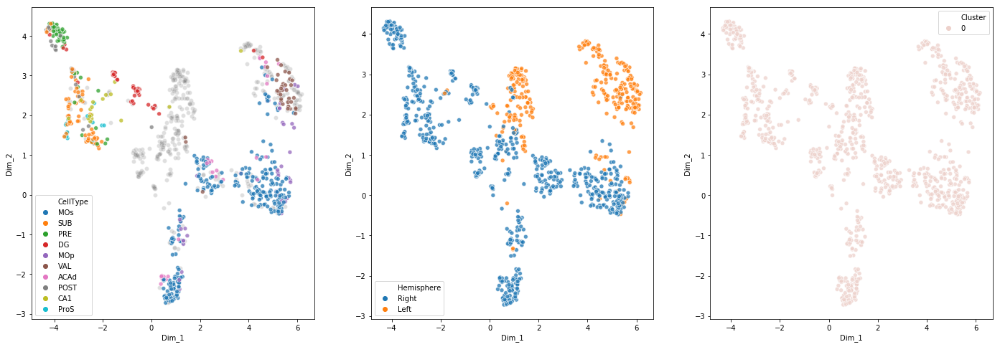

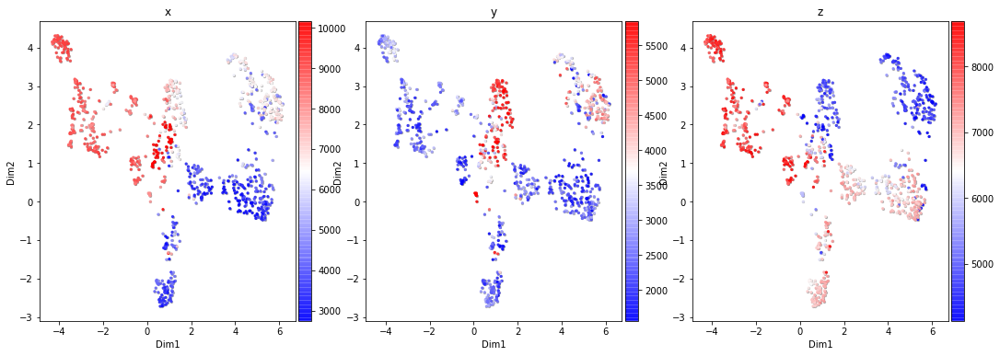

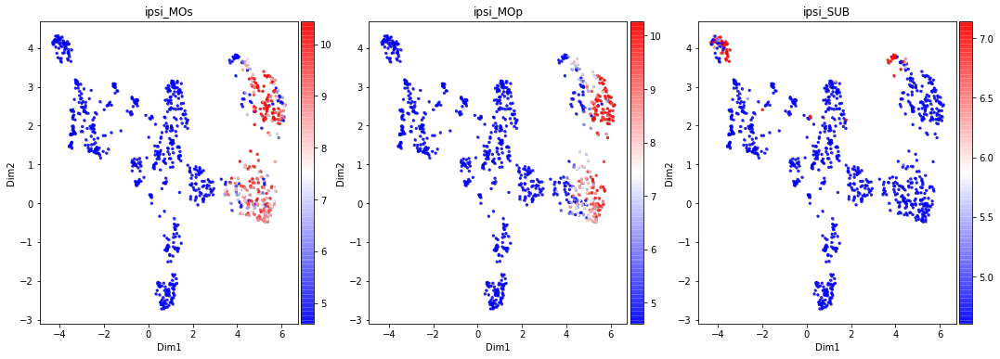

In [7]:
_ = ns.ReduceDimUMAP(feature_set="projection_features", n_neighbors=100)
_ = ns.FeatureScatter(["CellType", "Hemisphere", "Cluster"], map="UMAP")
_ = ns.FeatureScatter(["x", "y", "z"], map="UMAP")
_ = ns.FeatureScatter(["ipsi_MOs", "ipsi_MOp", "ipsi_SUB"], map="UMAP")

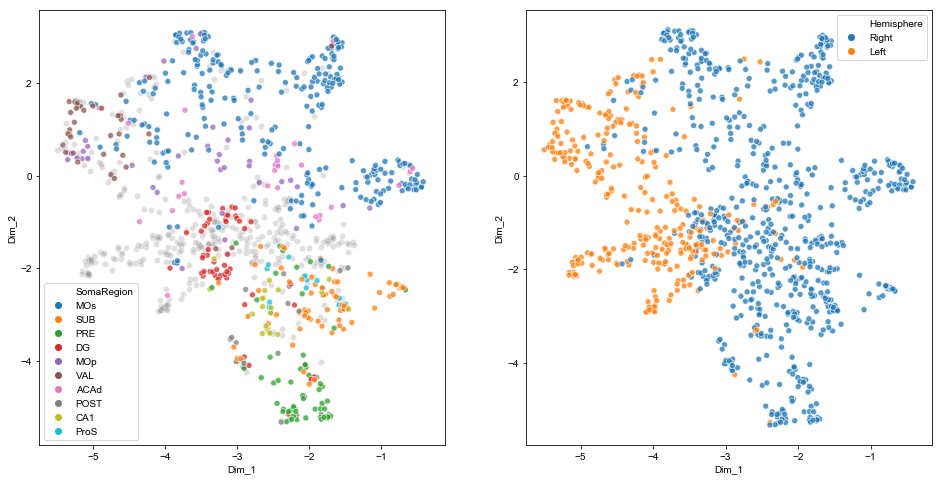

In [129]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

def FeatureScatter(self, feature_name, map="UMAP"):
    # Find feature values
    if type(feature_name) == list:
        z = self.get_feature_list_values(feature_list=feature_name)
    else:
        z = self.get_feature_values(feature_name=feature_name)
    # Find reduced dimension data
    if map == "UMAP":
        x = self.UMAP.iloc[:,0]
        y = self.UMAP.iloc[:,1]
    elif map == "PCA":
        x = self.PCA.iloc[:, 0]
        y = self.PCA.iloc[:, 1]
    else:
        assert True, "neuron_set.FeatureScatter(self, feature_name, map='UMAP'): Invalid map."
        return
    # If feature is categorical
    if z.select_dtypes(include=['float', 'int']).shape[1] == z.shape[1]: # If all values are numeric
        fig = quantitative_scatter(x, y, z)
    else:
        fig = qualitative_scatter(x, y, z)
    return fig

def quantitative_scatter(x, y, c, cmap='bwr', alpha=0.75, s=5):
    max_col = 3
    subplot_w = 6
    subplot_h = 6
    feature_list = c.columns.tolist()
    subplot_n = len(feature_list)
    if subplot_n<=max_col:
        n_col = subplot_n
        n_row = 1
    else:
        n_col = max_col
        n_row = int(subplot_n / max_col)
        if (subplot_n % max_col) != 0:
            n_row += 1
    fig, ax = plt.subplots(n_row, n_col,
                           figsize=(subplot_w * n_col,
                                    subplot_h * n_row),
                           squeeze=False
                           )
    ax = ax.reshape(-1)
    for i, cur_ax in enumerate(ax.tolist()[:subplot_n]):
        feature_name = c.columns.tolist()[i]
        cur_ax.scatter(x, y, 
                       c=(.5,.5,.5), 
                       s=s,
                       alpha=0.5)
        P = cur_ax.scatter(x, y, 
                           c=c[feature_name], 
                           cmap=cmap, 
                           s=s,
                           vmax=np.percentile(c[feature_name], q=95),
                           vmin=np.percentile(c[feature_name], q=5),
                           alpha=alpha)
        cur_ax.set_xlabel("Dim1")
        cur_ax.set_ylabel("Dim2")
        cur_ax.set_title(feature_name)
        # Creating color bar
        divider = make_axes_locatable(cur_ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(P, cax)
    return fig

def qualitative_scatter(x, y, c):
    max_col = 3
    subplot_w = 8
    subplot_h = 8
    feature_list = c.columns.tolist()
    subplot_n = len(feature_list)
    if subplot_n <= max_col:
        n_col = subplot_n
        n_row = 1
    else:
        n_col = max_col
        n_row = int(subplot_n / max_col)
        if (subplot_n % max_col) != 0:
            n_row += 1
    fig, ax = plt.subplots(n_row, n_col,
                           figsize=(subplot_w * n_col,
                                    subplot_h * n_row),
                           squeeze=False
                           )
    ax = ax.reshape(-1)
    df = pd.DataFrame({'Dim_1':x, 'Dim_2':y})
    df = pd.concat([df, c.copy()], axis=1)
    for i, cur_ax in enumerate(ax.tolist()[:subplot_n]):
        feature_name = feature_list[i]
        ct = df[feature_name].value_counts()
        # Control length of legend
        if len(ct)>10:
            collapsed_features = ct[12:].index.tolist() + ['unknown', "fiber tracts"]
            df.loc[df[feature_name].isin(collapsed_features), feature_name] = "Others"
        
        ct = df[feature_name].value_counts()
        hue_order = ct.index.tolist()
        if hue_order.count('Others') > 0:
#             hue_order.append(hue_order.pop(hue_order.index('Others')))
            hue_order.pop(hue_order.index('Others'))
        
        sns.scatterplot(x='Dim_1', y='Dim_2', 
                        data=df[df[feature_name]=='Others'], 
                        c=(.5,.5,.5),
                        alpha=0.25,
#                         palette='Spectral',
                        ax=cur_ax)
        sns.scatterplot(x='Dim_1', y='Dim_2', 
                        hue=feature_name, hue_order=hue_order, 
                        data=df[df[feature_name]!='Others'],
#                         palette='Spectral',
                        alpha=0.75,
                        ax=cur_ax)
    return fig

# fig = quantitative_scatter(Z_umap[0], Z_umap[1], tp_df[cluster_marker], cmap='Reds', alpha=0.85)
fig = FeatureScatter(ns, ["SomaRegion", "Hemisphere"])

## Testing PCA + UMAP


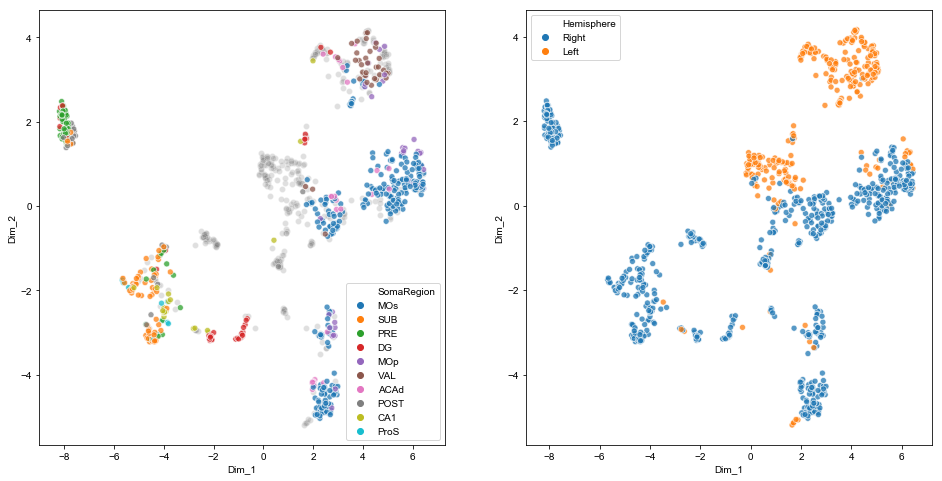

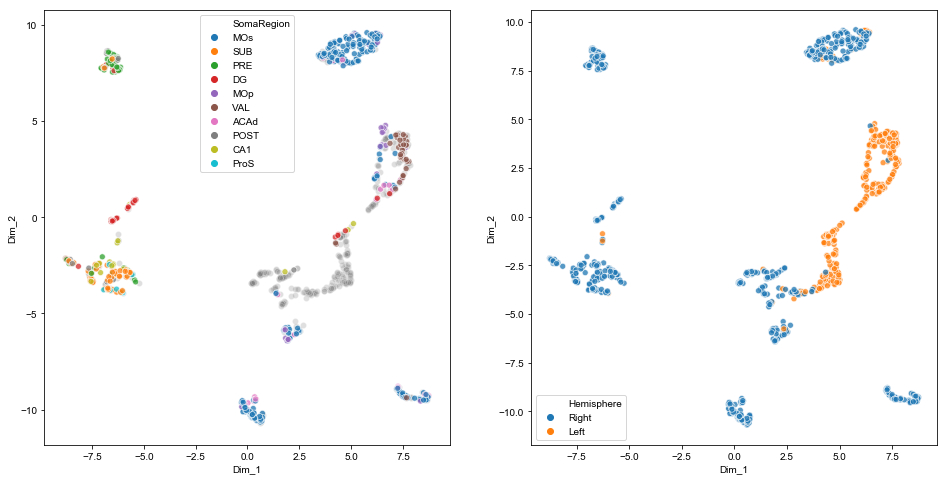

In [133]:

from sklearn.decomposition import PCA
df = ns.features["projection_features"].scaled_data.copy()
Z = PCA(n_components=500).fit_transform(df)
Z_pca = pd.DataFrame(Z, index=df.index)

umap_reducer = umap.UMAP(n_neighbors=25,
                         n_components=2)

Z = umap_reducer.fit_transform(df)
Z_umap = pd.DataFrame(Z, index=df.index)
fig = qualitative_scatter(Z_umap[0], Z_umap[1], pd.DataFrame(ns.metadata[["SomaRegion", "Hemisphere"]]))

for n_pc in [10]:
    Z = umap_reducer.fit_transform(Z_pca.iloc[:,:n_pc])
    Z_umap = pd.DataFrame(Z, index=df.index)
    fig = qualitative_scatter(Z_umap[0], Z_umap[1], pd.DataFrame(ns.metadata[["SomaRegion", "Hemisphere"]]))

KNN_10...
UMAP_KNN_10...
KNN_25...
UMAP_KNN_25...


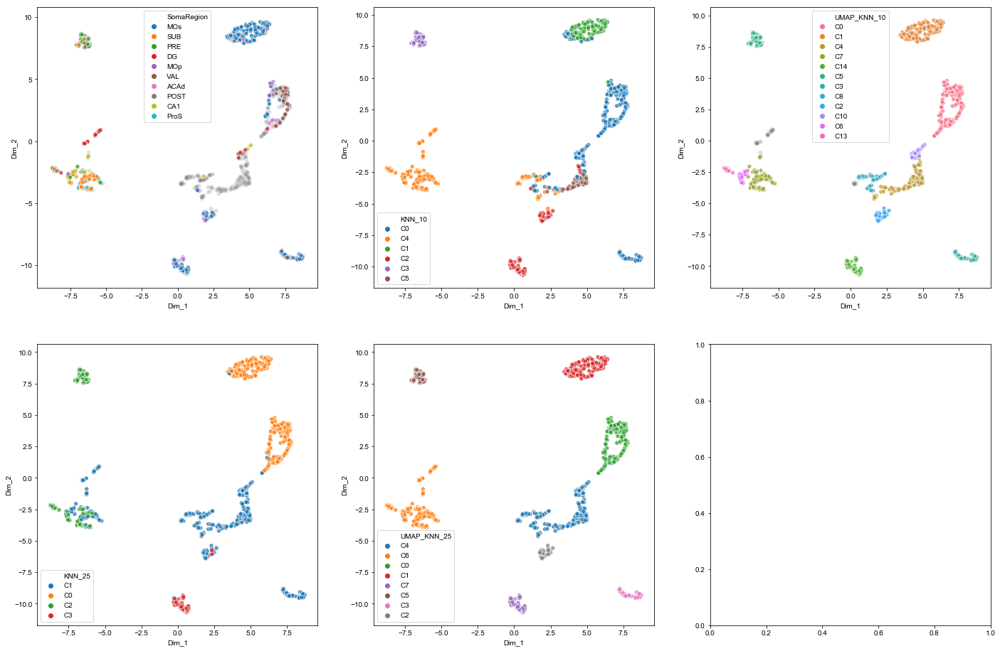

In [134]:
from neuro_morpho_toolbox import get_clusters

knn_list = [10, 25]
clusters = pd.DataFrame(index=x.index)
for knn in knn_list:
    cur_colname = 'KNN_'+str(knn)
    print("%s..." % (cur_colname))
    cur_clusters = get_clusters(df, knn=knn, metric='minkowski', method='FastGreedy')
    cur_clusters = pd.DataFrame({cur_colname:['C'+str(i) for i in cur_clusters]}, 
                                index=x.index
                               )
    clusters = pd.concat([clusters, cur_clusters], axis=1)
    cur_colname = 'UMAP_KNN_'+str(knn)
    print("%s..." % (cur_colname))
    cur_clusters = get_clusters(Z_umap, knn=knn, metric='minkowski', method='FastGreedy')
    cur_clusters = pd.DataFrame({cur_colname:['C'+str(i) for i in cur_clusters]}, 
                                index=x.index
                               )
    clusters = pd.concat([clusters, cur_clusters], axis=1)

tp_df = pd.concat([ns.metadata['SomaRegion'], clusters], axis=1)
fig = qualitative_scatter(Z_umap[0], Z_umap[1], tp_df)

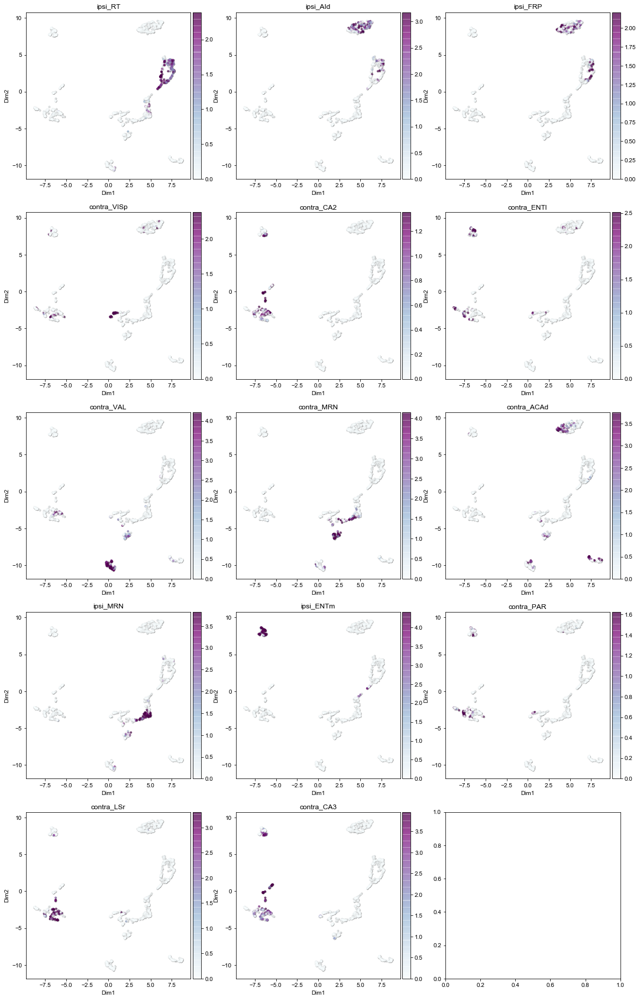

In [138]:
tp_df = df.copy()
tp_df = pd.concat([tp_df, clusters], axis=1)
tp_df.drop(['ipsi_fiber tracts', 'contra_fiber tracts'], axis=1, inplace=True)
med_df = tp_df.groupby('UMAP_KNN_10').median()
cluster_marker = []
for i in med_df.index.tolist():
    fg = med_df.loc[i]
    bg = med_df.loc[~med_df.index.isin([i])]
    fold = fg / bg.max()
    if not fold.idxmax() in cluster_marker:
        cluster_marker.append(fold.idxmax())

fig = quantitative_scatter(Z_umap[0], Z_umap[1], tp_df[cluster_marker] - np.log(100), cmap='BuPu', alpha=0.5, s=8)